In [3]:
! eups list -s lsst_distrib

   g4213664e8e+4c321e77d1 	current w_2023_30 setup


In [2]:
import numpy as np
from time import time
from tabulate import tabulate

from matplotlib import pyplot as plt
from matplotlib import lines
import matplotlib.colors as colors
from mpl_toolkits import axes_grid1

import lsst.daf.butler as daf_butler
import lsst.afw.display as afwDisplay
import lsst.afw.math as afwMath
from lsst.afw.cameraGeom import utils as cgu
from lsst import afw
from  lsst.eo.pipe.plotting import plotting_utils

from astropy.visualization import imshow_norm, MinMaxInterval,AsinhStretch,LinearStretch,SqrtStretch,ContrastBiasStretch,ZScaleInterval,AsymmetricPercentileInterval,ManualInterval

from lsst.obs.lsst import LsstCam
camera = LsstCam.getCamera()

# this has more of my code for use in Notebooks
from myutils import *

# Code

In [4]:
# This code makes a simgle mosaic from a list of data set references
class UserImageRefSource:
    isTrimmed = True
    background = 0.0

    def __init__(self, butler, image_refs):
        self.butler = butler
        self.image_refs = image_refs

    def getCcdImage(self, det, imageFactory, binSize=1, *args, **kwargs):
        ccdImage = butler.get(self.image_refs[det.getId()])
        ccdImage = afwMath.binImage(ccdImage, binSize)
        return afwMath.rotateImageBy90(ccdImage,
                                       det.getOrientation().getNQuarter()), det


def make_mosaic(butler, refs_map, camera, binSize, imageSourceClass):
    detectorNameList = [camera[detector].getName() for
                        detector in refs_map]
    image_source = imageSourceClass(butler, refs_map)
    return cgu.showCamera(camera, imageSource=image_source,
                          detectorNameList=detectorNameList,
                          binSize=binSize)

In [5]:
# this code only gets the lambda mosaics from a B or C run
def get_fp_image_lambda(acq_run='13391',physical_filter='nm750',binSize=8,write=True):
    repo = "/repo/ir2"
    weekly = 'w_2023_24'
    collections = ["u/lsstccs/eo_raft_lambda_mosaics_%s_%s"%(acq_run,weekly)]
    butler = daf_butler.Butler(repo, collections=collections)

    where = (f"exposure.science_program='{acq_run}' "
            f"and exposure.observation_reason='lambda' "
            f"and physical_filter='{physical_filter}' ")

    refs = set(butler.registry.queryDatasets('postISRCCD', where=where))
    assert len(refs) == 205
    image_refs = {}
    for ref in refs:
        image_refs[ref.dataId['detector']] = ref.makeComponentRef("image")
    
    camera = LsstCam.getCamera()
    t0 = time.time()
    fp_image = make_mosaic(butler, image_refs, camera, binSize,                 
                           UserImageRefSource)                                  
    print(time.time() - t0)
    
    if write:
        fp_image.writeFits('lambda_%s_%s.fits'%(physical_filter,acq_run))
        
    return fp_image

In [6]:
# this makes a focal plane image from a list of data set references
def get_fp_image(refs,binSize=8,outfile=None):
    
    assert len(refs) == 205
    image_refs = {}
    for ref in refs:
        image_refs[ref.dataId['detector']] = ref.makeComponentRef("image")
    
    camera = LsstCam.getCamera()
    t0 = time.time()
    fp_image = make_mosaic(butler, image_refs, camera, binSize,                 
                           UserImageRefSource)                                  
    print(time.time() - t0)
    
    if outfile != None:
        fp_image.writeFits('%s.fits'%(outfile))
        
    return fp_image

In [7]:
# these routines get exposure data set references for a desired data type, with selected options such as run number, filter, obs_id etc...

def build_where(acq_run=None,physical_filter=None,obs_id=None,eid=None,observation_type=None,observation_reason=None,detector=None):
    
    select = " \n instrument='LSSTCam' "
    if acq_run:
        select += " and exposure.science_program='%s' "%(acq_run)
    if physical_filter:
        select += " and physical_filter='%s' "%(physical_filter)
    if obs_id:
        select += " and exposure.obs_id in ( '%s' ) "%(obs_id)
    if eid:
        select += " and exposure='%d' ) "%(eid)
    if observation_type:
        select += " and exposure.observation_type in ( '%s' ) "%(observation_type)
    if observation_reason:
        select += " and exposure.observation_reason in ( '%s' ) "%(observation_reason)
    if detector:
        select += " and detector=%d "%(detector)
    select += "\n"
        
    return select

def get_exposure_refs(acq_run,datasetType,rettype='Dict',doexp=False,physical_filter=None,eid=None,obs_id=None,
                      observation_type=None,observation_reason=None,detector=None,
                      weekly='w_2023_24',operator='lsstccs',repo='/repo/ir2',verbose=0):
        
    # We use the collection naming scheme to find all of the chained collections for an eo_pipe analysis of 
    # the specified run.  For our dataset queries, we'll use these collections.
    butler = daf_butler.Butler(repo)
    collections = butler.registry.queryCollections(f"u/{operator}/*_{acq_run}_{weekly}",
                                               collectionTypes=daf_butler.CollectionType.CHAINED)
    if verbose>0:
        for item in collections:
            print(item)
    
    # now select images from the desired collections
    
    # NOTE: combined images, datasetTypes such as flat and dark, have no run number assigned, and using acq_run will cause an error
    combined_datasetTypes = ['flat','dark']
    if datasetType in combined_datasetTypes:
        use_acq_run = None
    else:
        use_acq_run = acq_run
            
    select = build_where(acq_run=use_acq_run,physical_filter=physical_filter,obs_id=obs_id,observation_type=observation_type,
                         observation_reason=observation_reason,detector=detector)
    if verbose>0:
        print(select)
    
    # get references
    dsrefs = list(set(butler.registry.queryDatasets(collections=collections,datasetType=datasetType,where=select).expanded()))
        
    # return either a list or a dictionary keyed by detector, with a list of images for that detector  
    if rettype=='List':
        if doexp:
            exposure_refs = [ref.makeComponentRef("image") for ref in dsrefs] # just get the image data not the masks, x2 faster
            return exposure_refs
        else:
            return dsrefs
    elif rettype=='Dict':
        refdict = {}
        for aref in dsrefs:
            key = aref.dataId['detector']
            if key not in refdict:
                refdict[key] = []
            refdict[key].append(aref)
        if doexp:
            imdict = {}
            for key in refdict.keys():
                imdict[key] = []
                imdict[key] = [ref.makeComponentRef("image") for ref in refdict[key]]
            for key in imdict.keys():
                alist = imdict[key]
                if len(alist)>1 and 'exposure' in alist[0].dataId:
                    alist.sort(key=lambda x: x.dataId['exposure'])                
            return imdict
        else:
            for key in refdict.keys():
                alist = refdict[key]
                if len(alist)>1 and 'exposure' in alist[0].dataId:
                    alist.sort(key=lambda x: x.dataId['exposure'])
            return refdict


In [8]:
def show_array(imarr,imrange=[2.5,97.5],interpolation='None',filterrad=4.,title=''):
    
    lo,hi = np.nanpercentile(imarr,imrange)

    f,ax = plt.subplots(1,1,figsize=(10.,10.))

    im, norm = imshow_norm(imarr, ax, origin='lower', interpolation=interpolation,cmap='plasma',
                           interval=ManualInterval(lo,hi), filterrad=filterrad,
                           stretch=LinearStretch())

    ax.set_title(title)
    ax.set_aspect('equal')
    add_colorbar(im)
    f.tight_layout(rect=[0, 0, 1, 0.99]) 
    
def show_ccd(butler,exp_ref,imrange=[2.5,97.5],interpolation='None',filterrad=4.,title=''):
    
    calexp= butler.get(exp_ref)
    
    if type(calexp) == afw.image._exposure.ExposureF:
        im = calexp.getImage().getArray()
    else:
        im = calexp.getArray()

    show_array(im,imrange,interpolation,filterrad,title)

    

# Table of images from a sample EO run

In [9]:
# setup the Butler
repo='/repo/ir2'
butler = daf_butler.Butler(repo)

In [10]:
# get data set references to all raw images in a Run, only need to specify one detector which was present
acq_run = '13421'
dsrefs_raw = get_exposure_refs(acq_run,'raw',detector=1,rettype='List',verbose=True) #can select any detector, only need to specify one

# make a DataFrame of summary info
df = get_refs_info(dsrefs_raw)  

u/lsstccs/bias_13421_w_2023_24
u/lsstccs/dark_13421_w_2023_24
u/lsstccs/flat_13421_w_2023_24
u/lsstccs/defects_13421_w_2023_24
u/lsstccs/ptc_13421_w_2023_24
u/lsstccs/eo_read_noise_13421_w_2023_24
u/lsstccs/eo_dark_current_13421_w_2023_24
u/lsstccs/eo_eper_13421_w_2023_24
u/lsstccs/eo_ptc_plots_13421_w_2023_24
u/lsstccs/eo_linearity_plots_13421_w_2023_24
u/lsstccs/eo_bright_defects_13421_w_2023_24
u/lsstccs/eo_divisadero_tearing_13421_w_2023_24
u/lsstccs/eo_bf_analysis_13421_w_2023_24
u/lsstccs/eo_cti_vs_flux_13421_w_2023_24
u/lsstccs/eo_dark_defects_13421_w_2023_24
u/lsstccs/eo_bias_shifts_13421_w_2023_24
u/lsstccs/eo_raft_amp_correlations_13421_w_2023_24
u/lsstccs/eo_persistence_13421_w_2023_24
u/lsstccs/eo_raft_calib_mosaics_13421_w_2023_24
u/lsstccs/eo_bias_stability_13421_w_2023_24
u/lsstccs/eo_raft_lambda_mosaics_13421_w_2023_24
 
 instrument='LSSTCam'  and exposure.science_program='13421'  and detector=1 



In [11]:
print(tabulate(df,headers='keys',tablefmt='psql'))

+-----+-------------------+---------------+----------------------+-----------------+-------------+--------------------+----------------------+-----------+-----------+-------------+-----------+------------+
|     | physical_filter   |            id | obs_id               |   exposure_time |   dark_time | observation_type   | observation_reason   |   day_obs |   seq_num |   mjd_begin |   mjd_end |   detector |
|-----+-------------------+---------------+----------------------+-----------------+-------------+--------------------+----------------------+-----------+-----------+-------------+-----------+------------|
|  68 | unknown           | 3023062400697 | MC_C_20230624_000697 |               0 |   0.0929999 | bias               | bias                 |  20230624 |       697 |     60119.9 |   60119.9 |          1 |
| 201 | unknown           | 3023062400698 | MC_C_20230624_000698 |               0 |   0.0909998 | bias               | bias                 |  20230624 |       698 |     60119

# get data set references for images from a sample EO run

In [12]:
# here is the run number, used in all cells below 
acq_run = '13421'

In [13]:
# get super flat combined images (these are just the High sFlat, not sure how to find the Lo sFlat)

# default option is to return a Dictionary keyed by detector number (0-204)
dsrefs_sflathi = get_exposure_refs(acq_run,'flat',verbose=True)
print(len(dsrefs_sflathi))
print(dsrefs_sflathi[98])

# also get a list, for use in making mosaics
dsrefs_list_sflathi = get_exposure_refs(acq_run,'flat',rettype='List')
print(len(dsrefs_list_sflathi))

# also get a list, for use in making mosaics
dsrefs_list_sflatlo = get_exposure_refs(acq_run,'flat',physical_filter='LOW',rettype='List')
print(len(dsrefs_list_sflatlo))

u/lsstccs/bias_13421_w_2023_24
u/lsstccs/dark_13421_w_2023_24
u/lsstccs/flat_13421_w_2023_24
u/lsstccs/defects_13421_w_2023_24
u/lsstccs/ptc_13421_w_2023_24
u/lsstccs/eo_read_noise_13421_w_2023_24
u/lsstccs/eo_dark_current_13421_w_2023_24
u/lsstccs/eo_eper_13421_w_2023_24
u/lsstccs/eo_ptc_plots_13421_w_2023_24
u/lsstccs/eo_linearity_plots_13421_w_2023_24
u/lsstccs/eo_bright_defects_13421_w_2023_24
u/lsstccs/eo_divisadero_tearing_13421_w_2023_24
u/lsstccs/eo_bf_analysis_13421_w_2023_24
u/lsstccs/eo_cti_vs_flux_13421_w_2023_24
u/lsstccs/eo_dark_defects_13421_w_2023_24
u/lsstccs/eo_bias_shifts_13421_w_2023_24
u/lsstccs/eo_raft_amp_correlations_13421_w_2023_24
u/lsstccs/eo_persistence_13421_w_2023_24
u/lsstccs/eo_raft_calib_mosaics_13421_w_2023_24
u/lsstccs/eo_bias_stability_13421_w_2023_24
u/lsstccs/eo_raft_lambda_mosaics_13421_w_2023_24
 
 instrument='LSSTCam' 

205
[DatasetRef(DatasetType('flat', {band, instrument, detector, physical_filter}, ExposureF, isCalibration=True), {instrument:

In [14]:
# get lambda flats
dsrefs_lambda = {}
filts = ['uv','blue','red','nm750','nm850','nm960']
for afilt in filts:
    dsrefs_lambda[afilt] = get_exposure_refs(acq_run,'postISRCCD',physical_filter=afilt)
    print(len(dsrefs_lambda[afilt]))

205
205
205
205
205
205


In [15]:
# get darks in list form
dsrefs_dark = get_exposure_refs(acq_run,'dark',rettype='List')
print(len(dsrefs_dark))

205


In [18]:
# get individual Flats from the super Flats (these are just the Hi level)
dsrefs_sflatim= get_exposure_refs(acq_run,'cpFlatProc')
print(len(dsrefs_sflatim[98]))

# get the Individual Flats as a list, need the Obs_id from the Table above
dsrefs_sflatim_seq = []
for i,seq_num in enumerate(range(740,745)):
    obs_id = 'MC_C_20230624_000%d' % (seq_num)
    print(obs_id)
    dsrefs_sflatim_seq.append(get_exposure_refs(acq_run,'cpFlatProc',obs_id=obs_id,rettype='List'))
print(len(dsrefs_sflatim_seq[0]))
print(len(dsrefs_sflatim_seq[1]))
print(len(dsrefs_sflatim_seq[2]))
print(len(dsrefs_sflatim_seq[3]))
print(len(dsrefs_sflatim_seq[4]))

5
MC_C_20230624_000740
MC_C_20230624_000741
MC_C_20230624_000742
MC_C_20230624_000743
MC_C_20230624_000744
205
205
205
205
205


In [19]:
# get individual Flats from the PTC, this returns a dictionary of all flats keyed by detector number
dsrefs_ptcim= get_exposure_refs(acq_run,'cpPtcProc')
print(len(dsrefs_ptcim[98]))

86


In [20]:
# get raw images for one exposure by obs_id
dsrefs_raw_oneim = get_exposure_refs(acq_run,'raw',obs_id='MC_C_20230624_000776')
print(len(dsrefs_raw_oneim))

205


# Make Mosaics for Individual CCDs

## Lambda flats

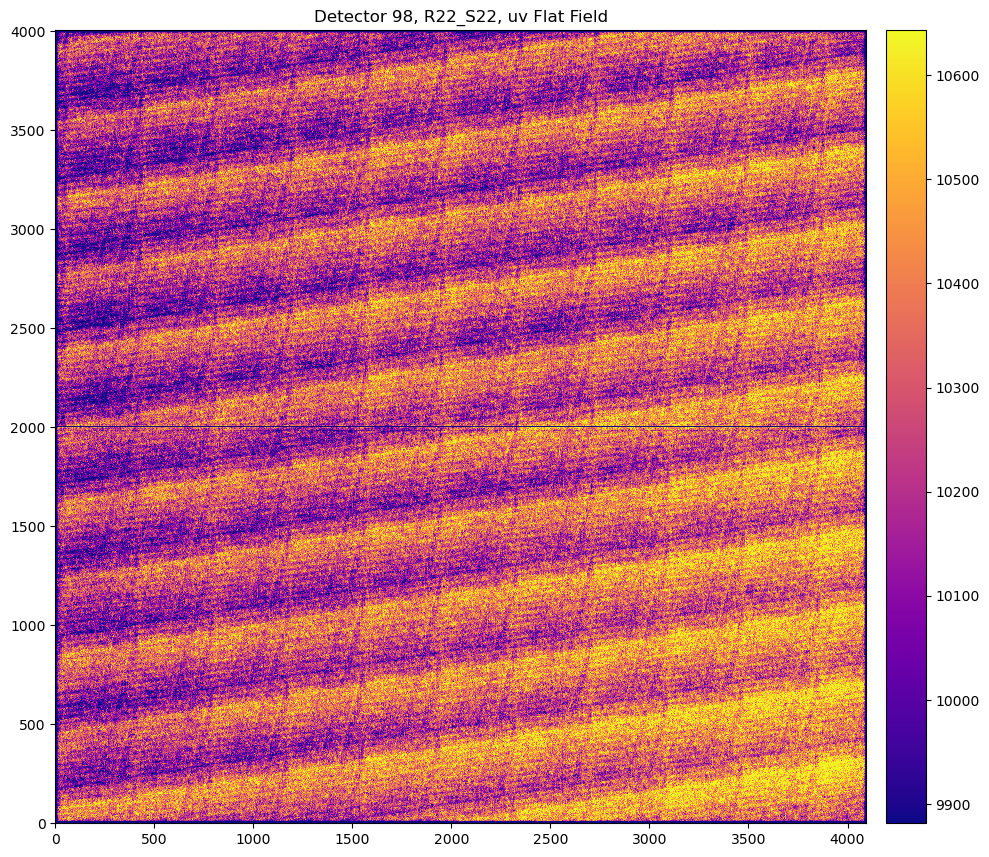

In [87]:
idet = 98
filt = 'uv'
title = 'Detector %d, %s, %s Flat Field'%(idet,det_names[idet],filt)
show_ccd(butler,dsrefs_lambda[filt][idet][0],interpolation='None',title=title)

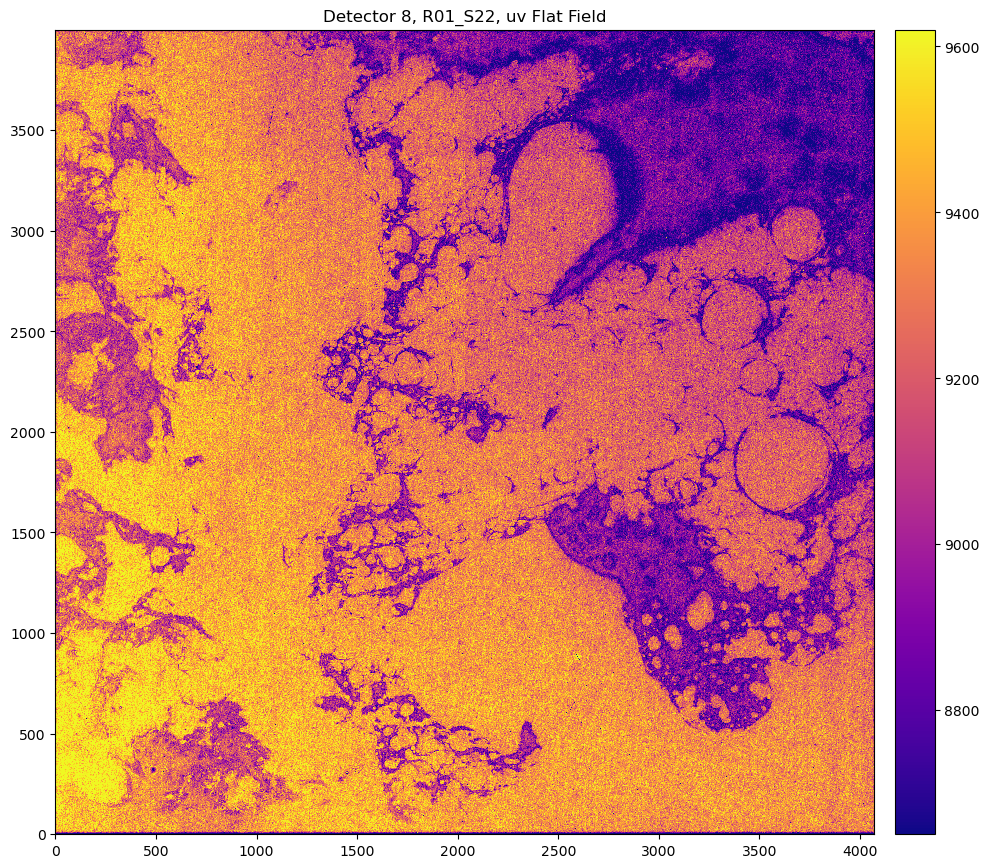

In [90]:
idet = 8
filt = 'uv'
title = 'Detector %d, %s, %s Flat Field'%(idet,det_names[idet],filt)
show_ccd(butler,dsrefs_lambda[filt][idet][0],interpolation='None',title=title)

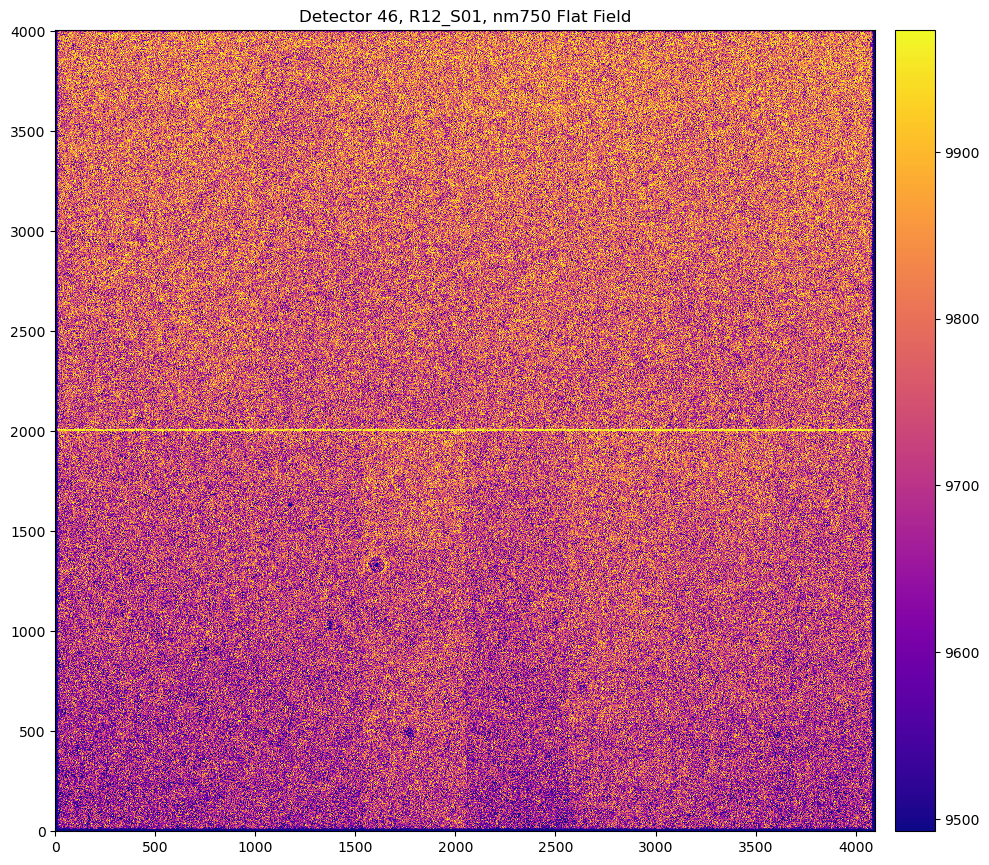

In [91]:
idet = 46
filt = 'nm750'
title = 'Detector %d, %s, %s Flat Field'%(idet,det_names[idet],filt)
show_ccd(butler,dsrefs_lambda[filt][idet][0],interpolation='None',title=title)

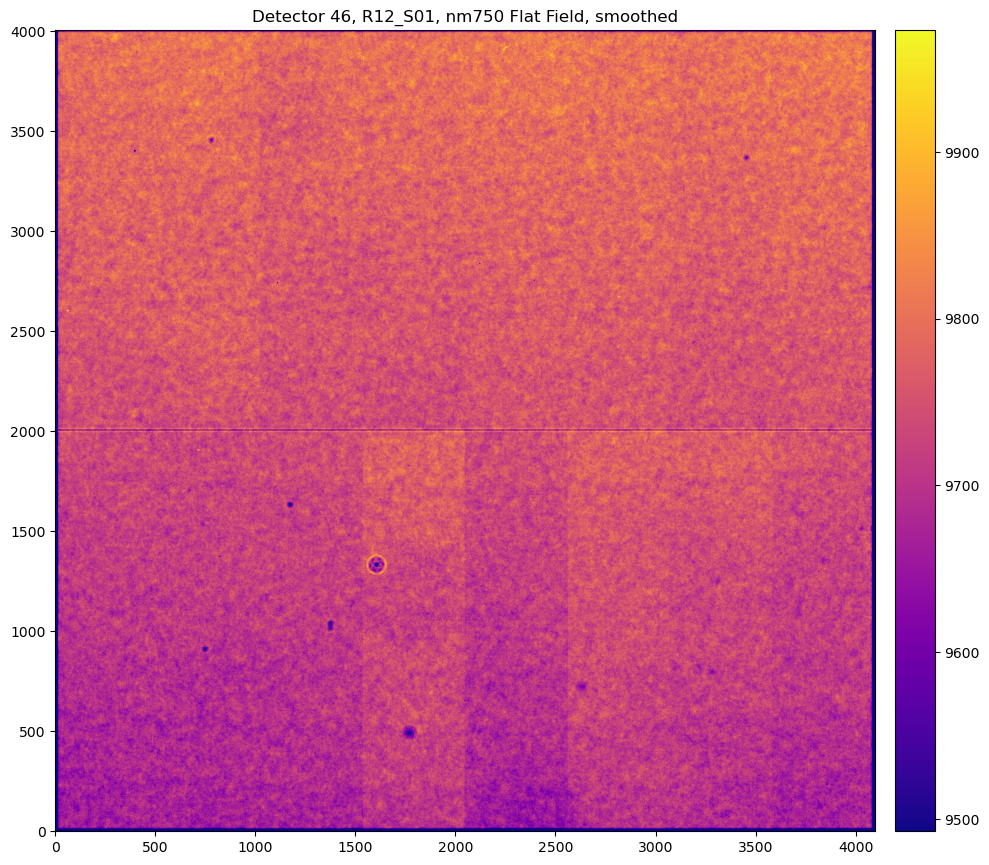

In [93]:
idet = 46
filt = 'nm750'
title = 'Detector %d, %s, %s Flat Field, smoothed'%(idet,det_names[idet],filt)
show_ccd(butler,dsrefs_lambda[filt][idet][0],interpolation='gaussian',title=title)

# Make full focal plane mosaics

In [98]:
filts = ['uv','blue','red','nm750','nm850','nm960']
for afilt in filts:
    fp_image = get_fp_image_lambda(acq_run='13421',physical_filter=afilt,binSize=8,write=True)

99.40969228744507
103.52152061462402
103.46988892555237
105.24420380592346
100.84822297096252
103.1354672908783


In [119]:
# make focal plane mosaics for the sflat Hi individual images
for i in range(5):
    fp_image = get_fp_image(dsrefs_sflatim_seq[i],binSize=8,outfile='sflat_%s_im%d'%(acq_run,i))

50.80987477302551
107.52456045150757
106.81934452056885
115.07129669189453
114.73865389823914


# make focal plane ratio of uv to 750 nm

In [99]:
images = {}
filts = ['uv','blue','red','nm750','nm850','nm960']
for filt in filts:
    hdu =  fits.open('lambda_%s_%s.fits' % (filt,acq_run))
    hdu.info()
    images[filt] = hdu[0].data

Filename: lambda_uv_13421.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: lambda_blue_13421.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: lambda_red_13421.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: lambda_nm750_13421.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: lambda_nm850_13421.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: lambda_nm960_13421.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   


In [100]:
uv_to_750 = images['uv']/images['nm750']
uv_to_750 = np.ma.filled(np.ma.masked_values(uv_to_750,0.0000),np.nan)

/tmp/ipykernel_9527/3260157788.py:1: RuntimeWarning: invalid value encountered in divide
  uv_to_750 = images['uv']/images['nm750']


0.9166141152381897 1.2647902965545654


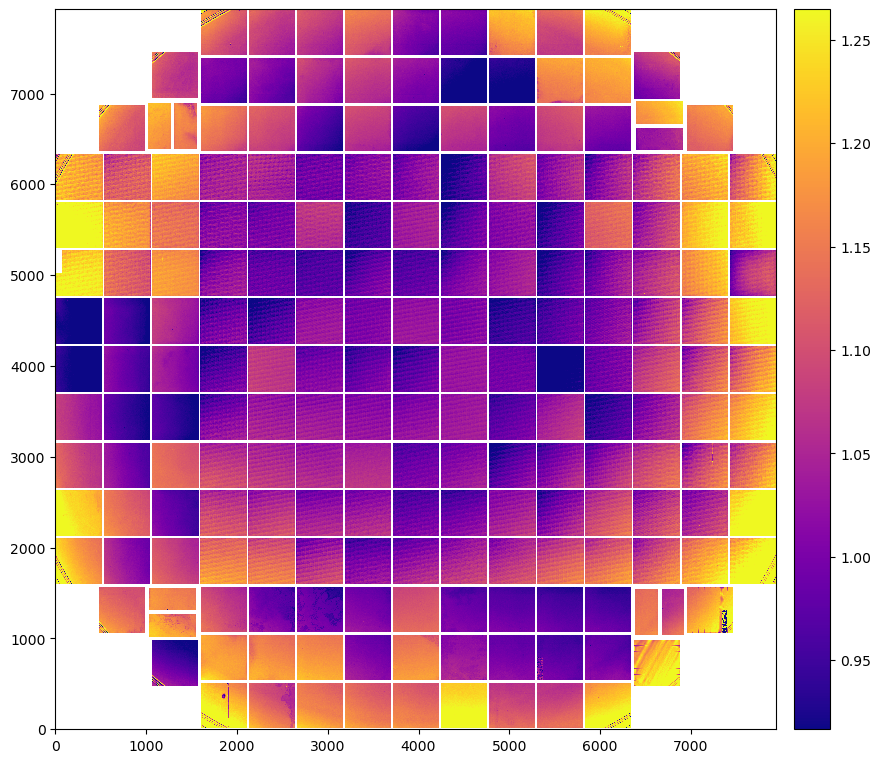

In [101]:
lo,hi = np.nanpercentile(uv_to_750,[2.5,97.5])
print(lo,hi)

f,ax = plt.subplots(1,1,figsize=(10.,10.))

im, norm = imshow_norm(uv_to_750, ax, origin='lower', interpolation='None',cmap='plasma',
                       interval=ManualInterval(lo,hi),
                       stretch=LinearStretch())
add_colorbar(im)
#f.savefig("mosaic_nm750_%s.pdf"%(acq_run))

In [104]:
nm960_to_750 = images['nm960']/images['nm750']
nm960_to_750 = np.ma.filled(np.ma.masked_values(nm960_to_750,0.0000),np.nan)

/tmp/ipykernel_9527/1153300238.py:1: RuntimeWarning: invalid value encountered in divide
  nm960_to_750 = images['nm960']/images['nm750']


1.0416858196258545 1.2213411331176758


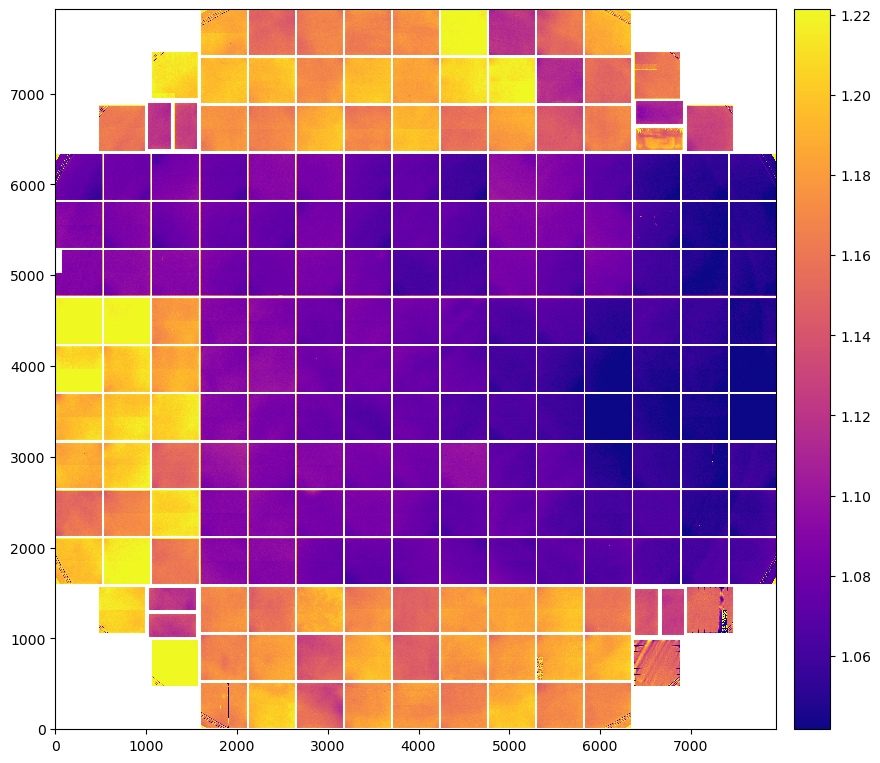

In [105]:
lo,hi = np.nanpercentile(nm960_to_750,[2.5,97.5])
print(lo,hi)

f,ax = plt.subplots(1,1,figsize=(10.,10.))

im, norm = imshow_norm(nm960_to_750, ax, origin='lower', interpolation='None',cmap='plasma',
                       interval=ManualInterval(lo,hi),
                       stretch=LinearStretch())
add_colorbar(im)
#f.savefig("mosaic_nm750_%s.pdf"%(acq_run))

# compare individual sflat images

In [21]:
sflat_ims = {}
for i in range(5):
    hdu =  fits.open('sflat_%s_im%d.fits' % (acq_run,i))
    hdu.info()
    sflat_ims[i] = hdu[0].data

Filename: sflat_13421_im0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: sflat_13421_im1.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: sflat_13421_im2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: sflat_13421_im3.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   
Filename: sflat_13421_im4.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      18   (7939, 7927)   float32   


In [36]:
mean0 = np.mean(sflat_ims[0])
mean1 = np.mean(sflat_ims[1])
nratio = mean0/mean1
print(mean0,mean1,nratio)

sflat_0to1 = nratio*sflat_ims[1]/sflat_ims[0]
sflat_0to1 = np.ma.filled(np.ma.masked_values(sflat_0to1,0.0000),np.nan)

22099.332 22097.291 1.0000924


/tmp/ipykernel_11710/2674200313.py:6: RuntimeWarning: invalid value encountered in divide
  sflat_0to1 = nratio*sflat_ims[1]/sflat_ims[0]


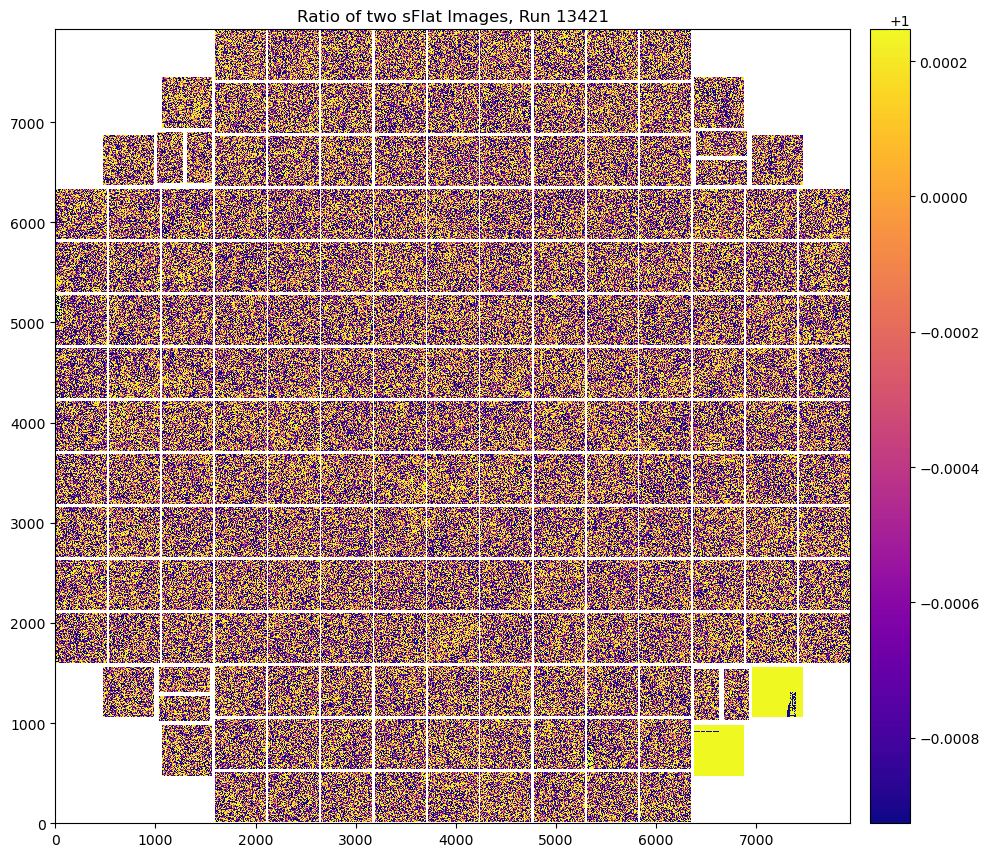

In [37]:
show_array(sflat_0to1,interpolation='none',title='Ratio of two sFlat Images, Run 13421',imrange=[25.,75.])

0.9985491633415222 1.000795602798462


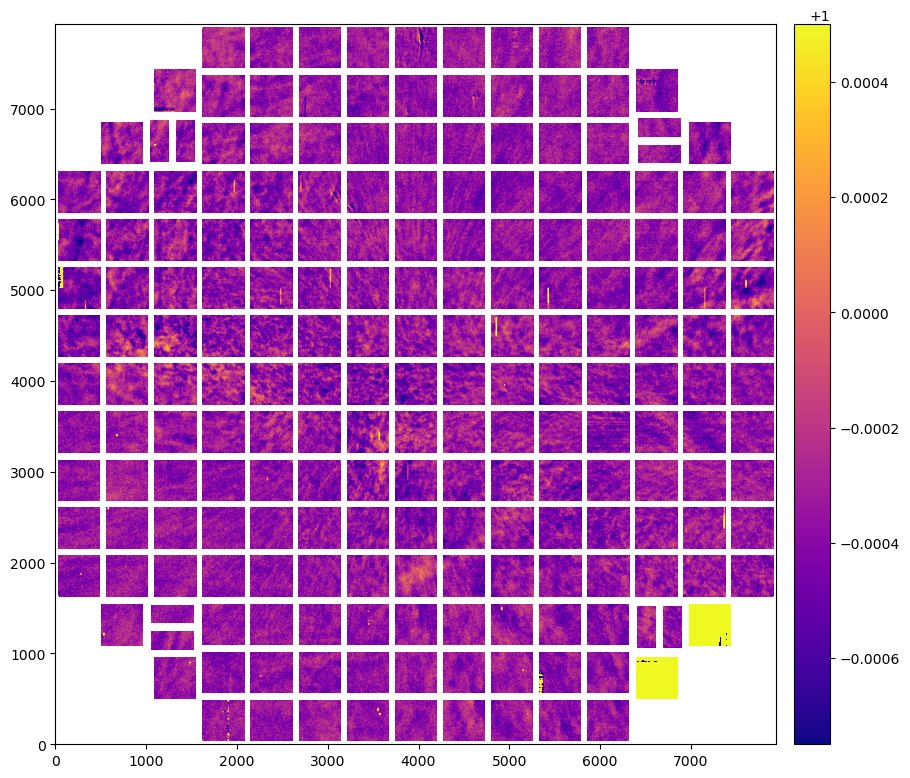

In [40]:
lo,hi = np.nanpercentile(sflat_0to1,[10.0,90.0])
print(lo,hi)

lo = .99925
hi = 1.0005
f,ax = plt.subplots(1,1,figsize=(10.,10.))

im, norm = imshow_norm(sflat_0to1, ax, origin='lower', interpolation='gaussian',cmap='plasma',
                       interval=ManualInterval(lo,hi),
                       stretch=LinearStretch())
add_colorbar(im)

In [41]:
import scipy.ndimage as ndimage

sflat_0to1_5sig = ndimage.gaussian_filter(sflat_0to1, sigma=5)

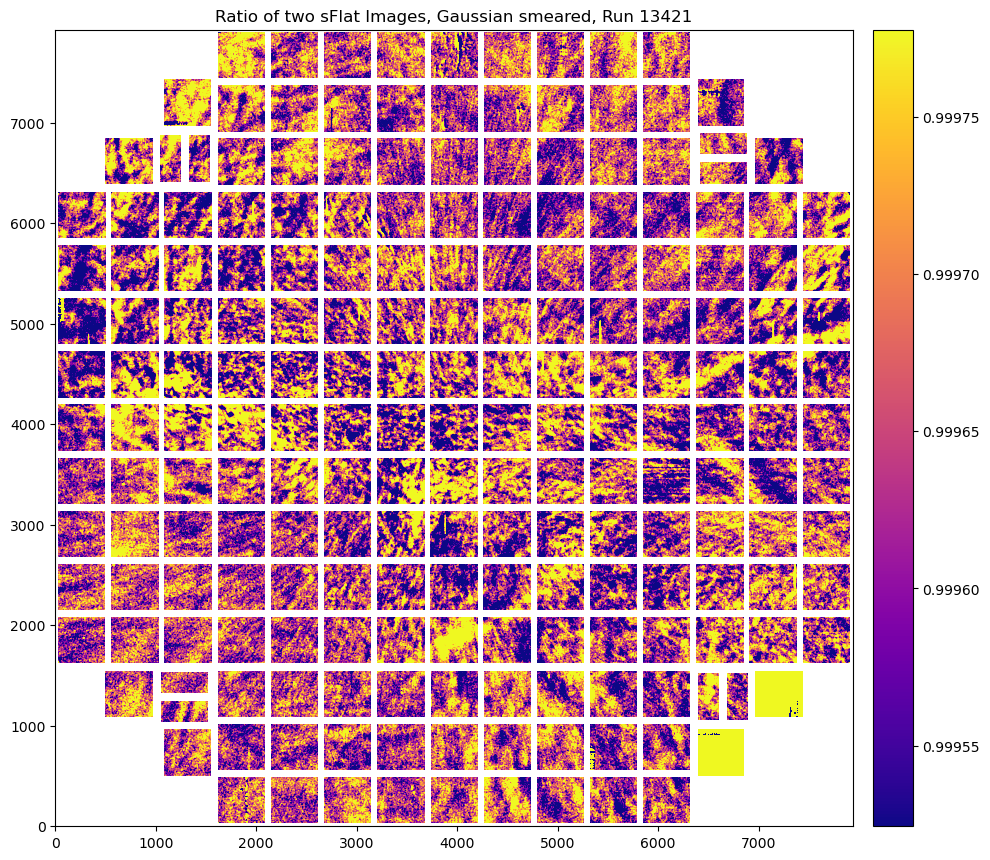

In [42]:
show_array(sflat_0to1_5sig,interpolation='none',title='Ratio of two sFlat Images, Gaussian smeared, Run 13421',imrange=[10.,90.])

## plot another pair of flats

In [43]:
mean1 = np.mean(sflat_ims[1])
mean2 = np.mean(sflat_ims[2])
nratio = mean1/mean2
print(mean1,mean2,nratio)

sflat_2to1 = nratio*sflat_ims[2]/sflat_ims[1]
sflat_2to1 = np.ma.filled(np.ma.masked_values(sflat_2to1,0.0000),np.nan)

22097.291 22093.686 1.0001632


/tmp/ipykernel_11710/3166119373.py:6: RuntimeWarning: invalid value encountered in divide
  sflat_2to1 = nratio*sflat_ims[2]/sflat_ims[1]


In [44]:
sflat_2to1_5sig = ndimage.gaussian_filter(sflat_2to1, sigma=5)

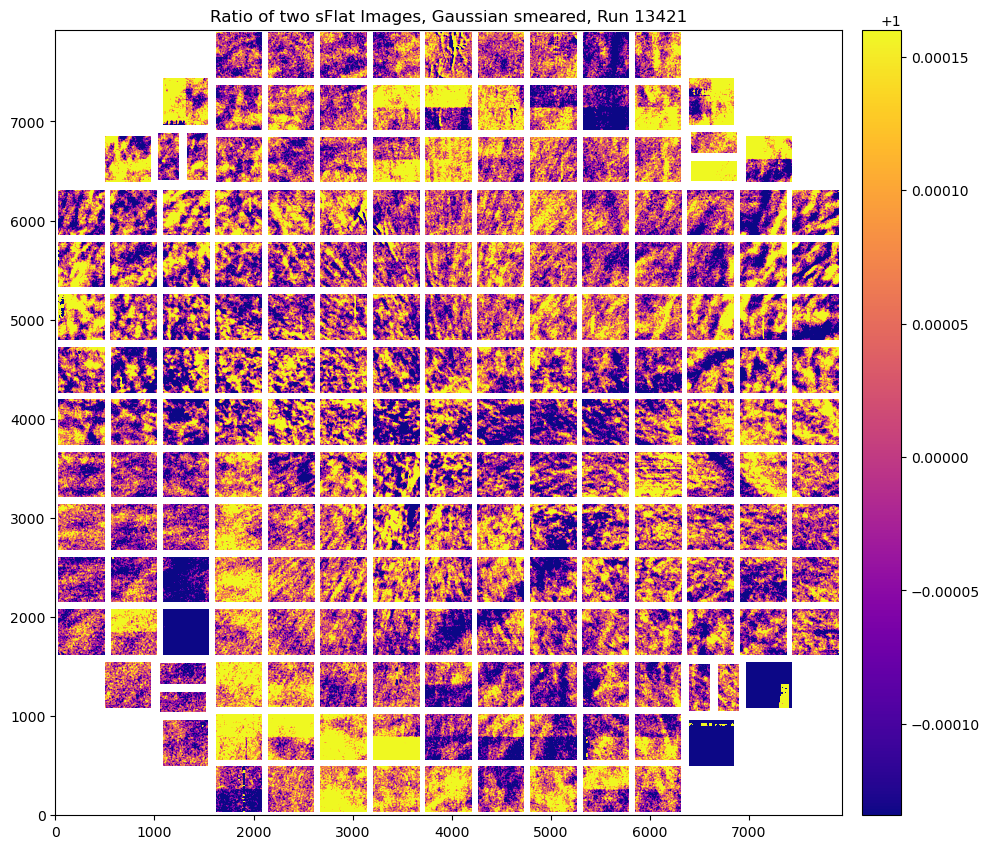

In [45]:
show_array(sflat_2to1_5sig,interpolation='none',title='Ratio of two sFlat Images, Gaussian smeared, Run 13421',imrange=[10.,90.])

In [46]:
mean0 = np.mean(sflat_ims[0])
mean3 = np.mean(sflat_ims[3])
nratio = mean0/mean3
print(mean0,mean3,nratio)

sflat_3to0 = nratio*sflat_ims[3]/sflat_ims[0]
sflat_3to0 = np.ma.filled(np.ma.masked_values(sflat_3to0,0.0000),np.nan)
sflat_3to0_5sig = ndimage.gaussian_filter(sflat_3to0, sigma=5)

22099.332 22090.926 1.0003805


/tmp/ipykernel_11710/332137076.py:6: RuntimeWarning: invalid value encountered in divide
  sflat_3to0 = nratio*sflat_ims[3]/sflat_ims[0]


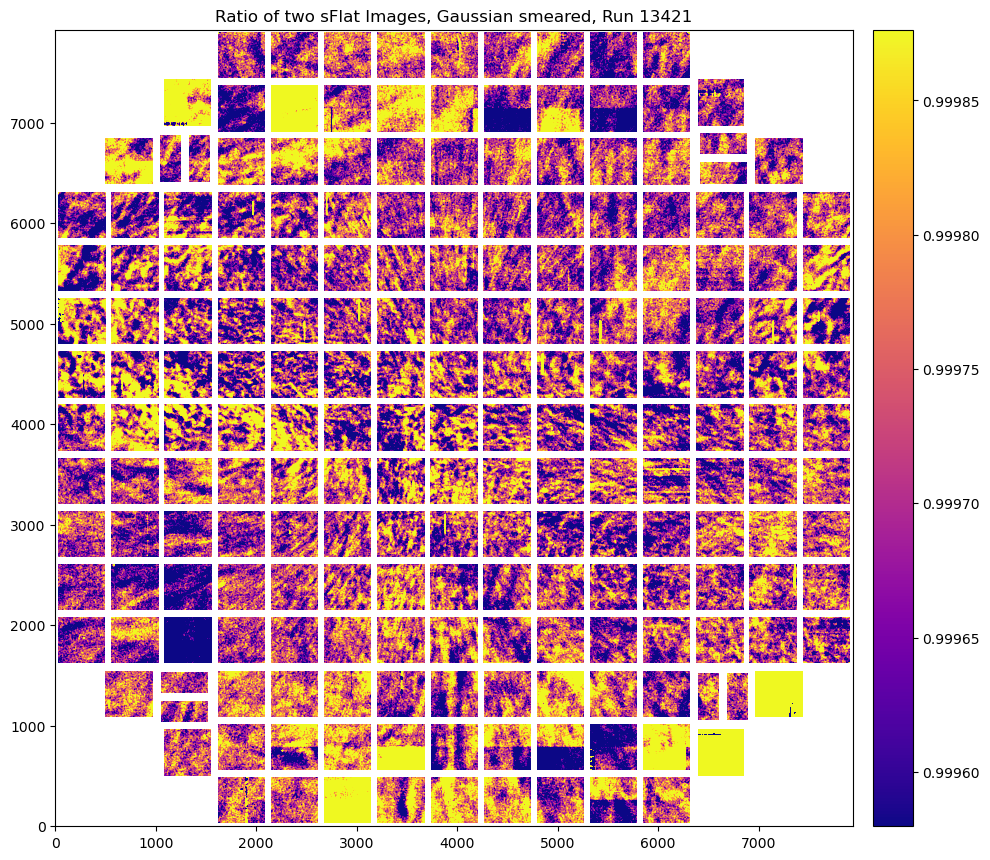

In [47]:
show_array(sflat_3to0_5sig,interpolation='none',title='Ratio of two sFlat Images, Gaussian smeared, Run 13421',imrange=[10.,90.])